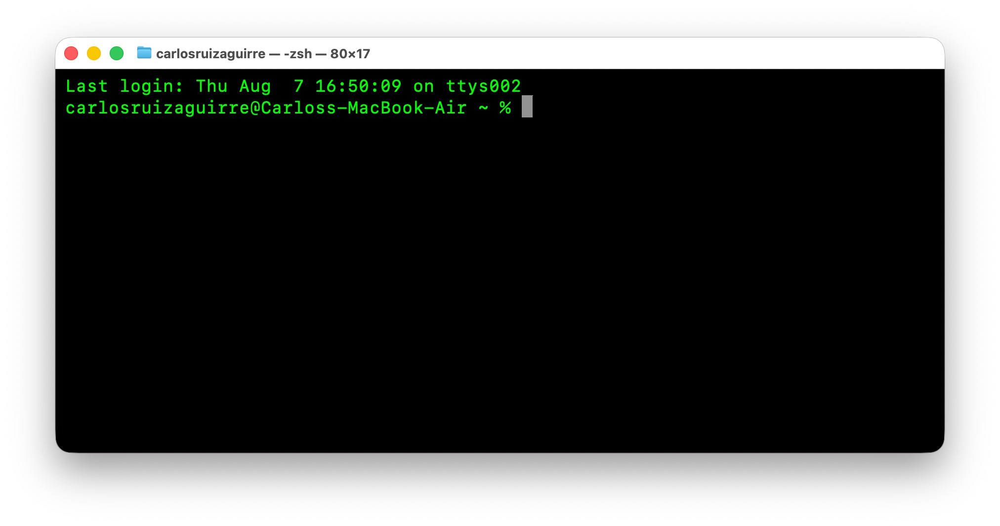

# Logging

The logging package in Python is a standard module that provides a way to record messages about a program’s execution. It is used to track events, errors, or informational messages, helping developers monitor and debug applications. Despite is wide use there are some drawbacks:

- The logging package was added in 2002. It still has outdated code.
- It doesn't follow modern conventions like PEP8 coding style.

**Notes**: 
- Notebook, code and figures from on mCoding [video](https://www.youtube.com/watch?v=9L77QExPmI0). 
- Python 3.12 to support QueueHandler.
- To simulate a plain Python file logging enviroment the following auxilliary functions will be used in order to ensure a proper logging behaviour:

In [1]:
import os

root_dir = "logs"

for dirpath, dirnames, filenames in os.walk(root_dir):
    for f in filenames:
        os.remove(os.path.join(dirpath, f)) # reset log files while keeping the dir structure

In [2]:
import subprocess
import tempfile

def run_code_as_py(code: str) -> tuple[str, str]:
    """
    Executes Python code as a standalone .py script and returns stdout and stderr.

    Args:
        code (str): Python code to execute.

    Returns:
        tuple[str, str]: (stdout, stderr) from the executed script.
    """
    # Create a temporary .py file
    with tempfile.NamedTemporaryFile(mode="w", suffix=".py", delete=False) as f:
        f.write(code)
        filename = f.name

    # Run the script in a subprocess
    result = subprocess.run(
        ["python3.13", filename], # python3 on Unix-like systems, adjust for Windows if needed
        capture_output=True,
        text=True
    )

    return result.stdout, result.stderr

def run_module (module: str) -> tuple[str, str]:
    """
    Executes a Python module and returns stdout and stderr. Essential for making visible 
    modules that are not in the current directory.

    Args:
        module (str): Name of the Python module to execute.

    Returns:
        tuple[str, str]: (stdout, stderr) from the executed module.
    """
    result = subprocess.run(
        ["python3.13", "-m", module],  # python3 on Unix-like systems, adjust for Windows if needed
        capture_output=True,
        text=True
    )
    
    return result.stdout, result.stderr

def run(file: str) -> tuple[str, str]:
    """
    Executes a Python file and returns stdout and stderr.

    Args:
        file (str): Path to the Python file to execute.

    Returns:
        tuple[str, str]: (stdout, stderr) from the executed script.
    """
    result = subprocess.run(
        ["python3.13", file],  # python3 on Unix-like systems, adjust for Windows if needed
        capture_output=True,
        text=True
    )
    
    return result.stdout, result.stderr

## 1. Basic Logging

Method `getLogger()` allow us to create a named logger. Loggers can be hierarchical expanded using dot notation, such as `logging.getLogger("parent.child")`. This enables structured logging, where child loggers inherit configuration from their parent logger unless explicitly overridden.

For example:
- `logging.getLogger("app")`
- `logging.getLogger("app.module")`
- `logging.getLogger("app.module.submodule")`

This hierarchy helps organize logs from different parts of a larger application. The logger name hierarchy is analogous to the Python package hierarchy and that's why `getLogger(__name__)` is always recommended. If no name is specified during the logger instantiation, it returns the root logger.

In [3]:
import logging

logging.basicConfig(level=logging.DEBUG) # level logging DEBUG or higher

logger = logging.getLogger(__name__)  
logger.warning("This is a warning message")

In [4]:
code = """
import logging

logging.basicConfig(level=logging.DEBUG) # level logging DEBUG or higher

logger = logging.getLogger(__name__)  
logger.warning("This is a warning message")
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> WARNING:__main__:This is a warning message



## 2. Logger Architecture

![Screenshot 2025-08-07 at 19.38.48-2.jpg](<attachment:Screenshot 2025-08-07 at 19.38.48-2.jpg>)
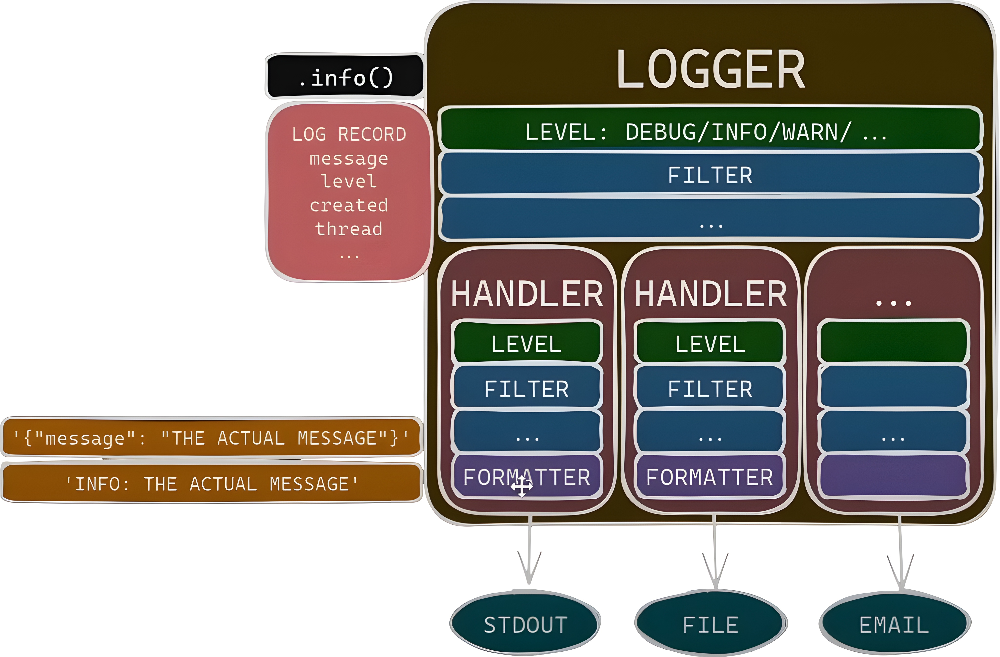

This module uses a hierarchical architecture based on **loggers, handlers, and formatters**. At the top of the hierarchy is the **root logger**, which provides default logging behavior if no other loggers are configured. Individual **loggers** are organized in a namespace hierarchy using dot-separated names (e.g., `app.module.submodule`), and they inherit settings and propagate messages up to their parent loggers by default. Each logger can have multiple **handlers**, which determine where the log messages go, such as the console, files, or network destinations. **Formatters** are attached to handlers to control the layout and content of log messages. This hierarchy allows fine-grained control: log levels, message propagation, and formatting can be configured at different points in the tree, enabling both global and module-specific logging behavior.

## 2.1 Record object

Every time something is logged a `LogRecord` instance is created, it mainly contains useful information about the logged event like

- **message**: The logged message, computed as msg % args.
- **level**: The severity level of the event (e.g., DEBUG, INFO, WARNING).
- **name**: The name of the logger that generated the event.
- **pathname**: The full path of the source file where the logging call was made.
- **lineno**: The line number in the source file where the logging call was made.
- **funcName**: The function name from which the logging call was made.
- **created**: The time when the LogRecord was created (as a timestamp).
- **thread** / **process**: Thread and process identifiers.
- **exc_info**: Exception information, if any was provided.

## 2.2 Logger Level Attribute

Each logger has a `level` attribute that determines which messages it will process. Messages with a severity level lower than the logger's level will be ignored.

By default there are **five** standard levels indicating the severity of events:

| **Level**          | **Numeric Value** | **What it means / When to use it**                                                                                                                                                                                       |
| ------------------ | ----------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ |
| `logging.NOTSET`   | 0                 | When set on a logger, indicates that ancestor loggers are to be consulted to determine the effective level. If that still resolves to NOTSET, then all events are logged. When set on a handler, all events are handled. |
| `logging.DEBUG`    | 10                | Detailed information, typically only of interest to a developer trying to diagnose a problem.                                                                                                                            |
| `logging.INFO`     | 20                | Confirmation that things are working as expected.                                                                                                                                                                        |
| `logging.WARNING`  | 30                | An indication that something unexpected happened, or that a problem might occur in the near future (e.g., "disk space low"). The software is still working as expected.                                                  |
| `logging.ERROR`    | 40                | Due to a more serious problem, the software has not been able to perform some function.                                                                                                                                  |
| `logging.CRITICAL` | 50                | A serious error, indicating that the program itself may be unable to continue running.                                                                                                                                   |


The level can be set using:
- `logger.setLevel(logging.DEBUG)`
- `logger.setLevel(logging.INFO)`
- `logger.setLevel(logging.WARNING)`

You can check the current level with `logger.level` or `logger.getEffectiveLevel()`.

By default, the `root` logger's level is set to `WARNING`, which means it only processes messages at `WARNING`, `ERROR`, and `CRITICAL` levels. Child loggers inherit their level from parent loggers unless explicitly set.

In [5]:
# Once the logger level is set to DEBUG, we can log messages at different levels
logger.debug("This is a DEBUG message")
logger.info("This is an INFO message")
logger.warning("This is a WARNING message")
logger.error("This is an ERROR message")
logger.critical("This is a CRITICAL message")

DEBUG:__main__:This is a DEBUG message
INFO:__main__:This is an INFO message
ERROR:__main__:This is an ERROR message
CRITICAL:__main__:This is a CRITICAL message


In [6]:
code = """
import logging

logging.basicConfig(level=logging.DEBUG) # level logging DEBUG or higher

logger = logging.getLogger(__name__)

logger.debug("This is a DEBUG message")
logger.info("This is an INFO message")
logger.warning("This is a WARNING message")
logger.error("This is an ERROR message")
logger.critical("This is a CRITICAL message")
"""
stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> DEBUG:__main__:This is a DEBUG message
INFO:__main__:This is an INFO message
ERROR:__main__:This is an ERROR message
CRITICAL:__main__:This is a CRITICAL message



## 2.3 Logger Filter Attribute

Filters provide a more fine-grained mechanism than log levels for determining which log records to output. While levels provide a coarse-grained filtering mechanism, filters allow for more complex filtering logic.

A filter can be used to:
- Provide additional control over which log records are passed from a logger to its handlers
- Reject specific log records based on custom criteria (specific words, modules)
- Modify log records as they pass through the logging system

You can add a filter to a logger using:

`logger.addFilter(my_filter)`

To create a filter, you can:
1. Create a callable object with a `filter()` method that returns `True` to allow the record to be processed or `False` to reject it
2. Subclass `logging.Filter` and override its `filter()` method

Filters can be more powerful than levels because they can examine the entire `LogRecord` object, not just its level. This allows for filtering based on logger name, message content, or any other attribute of the log record.

In [7]:
# Filter implementation example
class NonErrorFilter(logging.Filter):
    def filter(self, record):
        return record.levelno < logging.ERROR # LogRecord attributes
    
logger.addFilter(NonErrorFilter())

# Now, only messages below ERROR level will be logged
logger.debug("This is a DEBUG message")
logger.info("This is an INFO message")
logger.warning("This is a WARNING message")
logger.error("This is an ERROR message")  # This won't be logged
logger.critical("This is a CRITICAL message")  # This won't be logged either    

DEBUG:__main__:This is a DEBUG message
INFO:__main__:This is an INFO message


In [8]:
code = """

import logging

logging.basicConfig(level=logging.DEBUG) # level logging DEBUG or higher

logger = logging.getLogger(__name__)  

# Filter implementation example
class NonErrorFilter(logging.Filter):
    def filter(self, record):
        return record.levelno < logging.ERROR # LogRecord attributes
    
logger.addFilter(NonErrorFilter())

# Now, only messages below ERROR level will be logged
logger.debug("This is a DEBUG message")
logger.info("This is an INFO message")
logger.warning("This is a WARNING message")
logger.error("This is an ERROR message")  # This won't be logged
logger.critical("This is a CRITICAL message")  # This won't be logged either    
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> DEBUG:__main__:This is a DEBUG message
INFO:__main__:This is an INFO message



## 2.4 Logger Handlers

We have multiple handlers available. As an example:

1. **StreamHandler**  
   - Sends log messages to the console (`stdout`).  
   - Level set to `INFO`, so only messages `INFO` and above appear in the console.

2. **FileHandler**  
   - Writes all log messages to a file (`my_log.log`).  
   - Level set to `DEBUG`, so all messages from `DEBUG` and above are saved.

3. **RotatingFileHandler**  
   - Writes logs to a file with automatic rotation based on size.  
   - `maxBytes=1024` and `backupCount=3` create up to 3 backup files.  
   - Level set to `WARNING`, so only warnings and higher are written.

4. **TimedRotatingFileHandler**  
   - Writes logs to a file with automatic rotation based on time (daily in this example).  
   - `backupCount=7` keeps 7 days of log history.  
   - Level set to `ERROR`, so only errors and critical messages are written.

In [9]:
code = """
import logging
from logging.handlers import RotatingFileHandler, TimedRotatingFileHandler

logging.basicConfig(level=logging.DEBUG) # level logging DEBUG or higher

logger = logging.getLogger(__name__)  

# Common formatter for all handlers
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')

# 1. StreamHandler → logs to console
console_handler = logging.StreamHandler()
console_handler.setLevel(logging.INFO)
console_handler.setFormatter(formatter)
logger.addHandler(console_handler)

# 2. FileHandler → logs to a simple file
file_handler = logging.FileHandler("logs/handlers/my_log.log")
file_handler.setLevel(logging.DEBUG)
file_handler.setFormatter(formatter)
logger.addHandler(file_handler)

# 3. RotatingFileHandler → file rotation based on size
rotating_handler = RotatingFileHandler(
    "logs/handlers/my_log_rotating.log", maxBytes=1024, backupCount=3
)
rotating_handler.setLevel(logging.WARNING)
rotating_handler.setFormatter(formatter)
logger.addHandler(rotating_handler)

# 4. TimedRotatingFileHandler → file rotation based on time (daily)
timed_handler = TimedRotatingFileHandler(
    "logs/handlers/my_log_timed.log", when="D", interval=1, backupCount=7
)
timed_handler.setLevel(logging.ERROR)
timed_handler.setFormatter(formatter)
logger.addHandler(timed_handler)

# Example log messages
logger.debug("Debug message")
logger.info("Info message")
logger.warning("Warning message")
logger.error("Error message")
logger.critical("Critical message")
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> DEBUG:__main__:Debug message
2025-08-17 00:21:39,700 - __main__ - INFO - Info message
INFO:__main__:Info message
2025-08-17 00:21:39,700 - __main__ - WARNING - Warning message
2025-08-17 00:21:39,701 - __main__ - ERROR - Error message
ERROR:__main__:Error message
2025-08-17 00:21:39,701 - __main__ - CRITICAL - Critical message
CRITICAL:__main__:Critical message



# 3. Logging Hierarchical Architecture

![Screenshot 2025-08-16 at 21.36.53-2.png](<attachment:Screenshot 2025-08-16 at 21.36.53-2.png>)
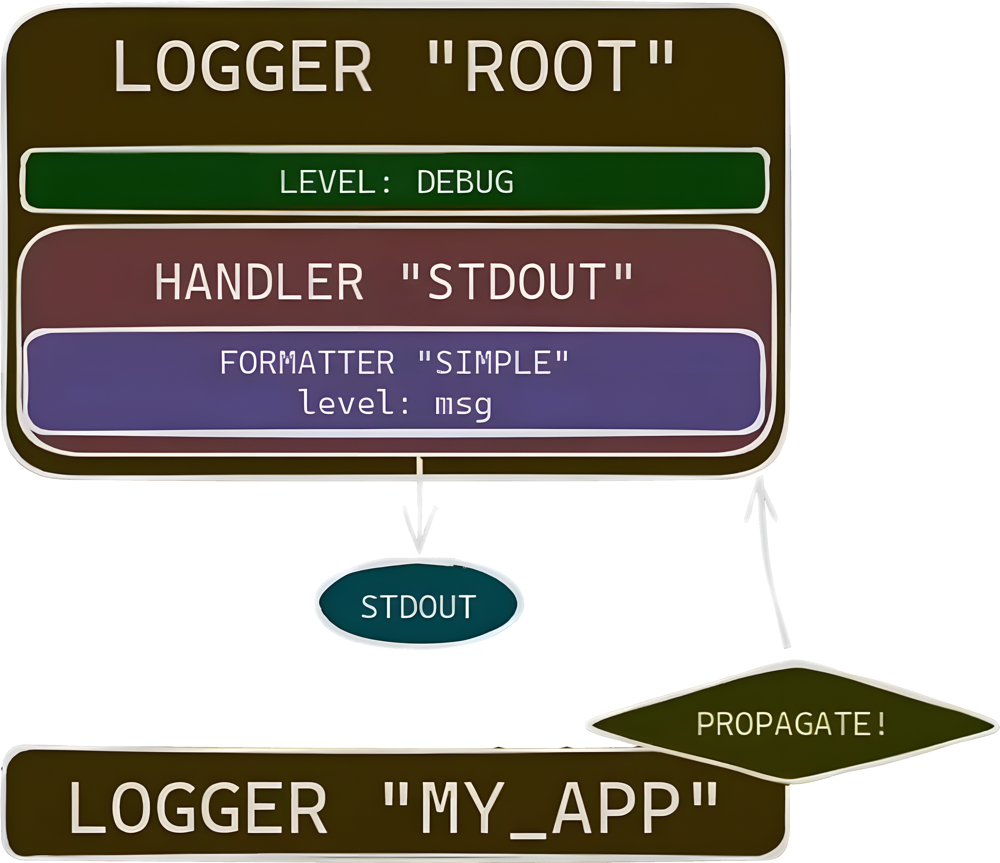

In this notebook, `MY_APP` has no handlers of its own, so it propagates log messages to the `root` logger, which then processes them using its configured handlers.

## 4. Configurations. Basic Config and Dict Config.

### 4.1 Basic Config

The `logging.basicConfig()` function provides a simple way to configure the root logger with common settings. It's typically used for basic logging configurations when more complex setups aren't needed.

The most important parameters:
- **level**: Set the threshold for the root logger (DEBUG, INFO, WARNING, ERROR, CRITICAL)
- **format**: Define the log message format
- **datefmt**: Specify date/time format in log messages
- **filename**: Send output to a file instead of stderr
- **filemode**: File opening mode ('a' for append, 'w' for overwrite)
- **stream**: Send output to a specific stream (e.g., sys.stdout)
- **handlers**: Add specific handlers instead of creating them automatically

**Important Notes:**
- `basicConfig()` only works if the root logger hasn't been configured yet
- Once the root logger has handlers, `basicConfig()` has no effect
- It's a convenience function for simple logging needs

In [10]:
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(name)s - %(levelname)s - %(message)s', force=True)

logger.warning("This is a warning message")

2025-08-17 00:21:39,710 - __main__ - WARNING - This is a warning message


In [11]:
code = """
import logging

logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')

logger = logging.getLogger(__name__) 
logger.warning("This is a warning message")
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> 2025-08-17 00:21:39,745 - __main__ - WARNING - This is a warning message



### 4.2 Dict Config

The `dictConfig` method provides a more comprehensive way to configure logging using a dictionary. This approach offers several advantages over `basicConfig`:

- **Centralized configuration**: Define all loggers, handlers, and formatters in one place
- **Hierarchical setup**: Easily configure parent-child logger relationships
- **Multiple handlers**: Configure different outputs (console, files, etc.) with different formatting
- **Complete customization**: Control every aspect of the logging system

The configuration dictionary has a specific structure with these main sections:

- **version**: Must be set to 1 (required)
- **formatters**: Define how log records are formatted as strings
- **handlers**: Specify where log records are sent (console, files, etc.)
- **loggers**: Configure named loggers with levels and handlers
- **root**: Special logger that acts as the base for all other loggers
- **incremental**: When True, merges with existing configuration (optional)
- **disable_existing_loggers**: When False, preserves existing loggers (default is True)

This approach is ideal for applications with complex logging requirements that need different handling for different components.

`basicConfig()` default values can be declared as:

In [12]:
basic_config ={
   "version": 1,
   "disable_existing_loggers": False,
   "formatters": {
      "simple": {
         "format": "%(levelname)s:%(name)s:%(message)s"
      }
   },
   "handlers": {
      "stdout": {
         "class": "logging.StreamHandler",
         "formatter": "simple",
         "stream": "ext://sys.stderr"
      }
   },
   "loggers": {
      "root": {
         "level": "DEBUG",
         "handlers": [
            "stdout"
         ]
      }
   }
}

In [13]:
code = """
import logging
import logging.config

basic_config ={
   "version": 1,
   "disable_existing_loggers": False,
   "formatters": {
      "simple": {
         "format": "%(levelname)s:%(name)s:%(message)s"
      }
   },
   "handlers": {
      "stdout": {
         "class": "logging.StreamHandler",
         "formatter": "simple",
         "stream": "ext://sys.stderr"
      }
   },
   "loggers": {
      "root": {
         "level": "DEBUG",
         "handlers": [
            "stdout"
         ]
      }
   }
}

logging.config.dictConfig(basic_config)

logger = logging.getLogger(__name__) 
logger.warning("This is a warning message")
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> WARNING:__main__:This is a warning message



## 5. Externalize the configuration (JSON and YAML)

You can externalize the logging configuration into a JSON file, keeping it separate from the code. The file follows the same structure expected by `logging.config.dictConfig()`, and the program just loads it and applies it. This makes it easier to adjust loggers, handlers, and formatters without changing the source code.

In [14]:
%cat logging_configs/basic_config.json

{
   "version": 1,
   "disable_existing_loggers": false,
   "formatters": {
      "simple": {
         "format": "%(levelname)s:%(name)s:%(message)s"
      }
   },
   "handlers": {
      "stdout": {
         "class": "logging.StreamHandler",
         "formatter": "simple",
         "stream": "ext://sys.stderr"
      }
   },
   "loggers": {
      "root": {
         "level": "DEBUG",
         "handlers": [
            "stdout"
         ]
      }
   }
}


In [15]:
code = """
import logging
import logging.config
import json

logging.config.dictConfig(json.load(open('logging_configs/basic_config.json')))

logger = logging.getLogger(__name__) 
logger.warning("This is a warning message")
"""

stdout, stderr = run_code_as_py(code)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> WARNING:__main__:This is a warning message



## 6. Use Cases

### 6.1 Warnings to STDERR and all to file

This configuration (`stderr_config.json`) creates a comprehensive logging setup with two output paths:

**Formatters**
- **simple**: Basic format showing just the log level and message.
- **detailed**: Complete format with timestamp, module, line number and message ISO-8601 compliant with timezone.

**Handlers**
- **stderr**: WARNING and higher level messages to standard error using the simple formatter
- **file**: Sends DEBUG and higher level messages to a rotating log file using the detailed formatter
    - Uses `RotatingFileHandler` that rotates when file reaches 10KB
    - Keeps up to 3 backup files
    - Logs stored in `logs/my_app.log`

In [16]:
%cat logging_configs/stderr_config.json

{
  "version": 1,
  "disable_existing_loggers": false,
  "formatters": {
    "simple": {
      "format": "%(levelname)s: %(message)s"
    },
    "detailed": {
      "format": "[%(levelname)s|%(module)s|L%(lineno)d] %(asctime)s: %(message)s",
      "datefmt": "%Y-%m-%dT%H:%M:%S%z"
    }
  },
  "handlers": {
    "stderr": {
      "class": "logging.StreamHandler",
      "level": "WARNING",
      "formatter": "simple",
      "stream": "ext://sys.stderr"
    },
    "file": {
      "class": "logging.handlers.RotatingFileHandler",
      "level": "DEBUG",
      "formatter": "detailed",
      "filename": "logs/stderr_config/my_app.log",
      "maxBytes": 10000,
      "backupCount": 3
    }
  },
  "loggers": {
    "root": {
      "level": "DEBUG",
      "handlers": [
        "stderr",
        "file"
      ]
    }
  }
}


In [17]:
%cat Advanced\ Examples/stderr.py

cat: Advanced Examples/stderr.py: No such file or directory


In [18]:
file = "advanced_examples/stderr.py"

stdout, stderr = run(file)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)


STDOUT:
> 
STDERR:
> WARNING: This is a warning message
ERROR: This is an error message
CRITICAL: This is a critical message



### 6.2 Warnings to STDERR and all to file in JSONL

This configuration (`stderr_json_config.json`) defines a dual-output logging setup with structured JSON logs and console warnings:

**Formatters**  
- **simple**: Minimal text format showing only the log level and message (`LEVEL: message`)  
- **json**: Custom JSON formatter that outputs logs as JSON objects, including level, message, timestamp, logger name, module, function, line number, and thread name  

**Handlers**  
- **stderr**: Sends WARNING and higher level logs to standard error using the simple text format  
- **file**: Writes DEBUG and higher level logs to a rotating JSON Lines file with the following properties:  
  - Stored at `logs/stderr_json_config/my_app.log.jsonl`  
  - Rotates when file size reaches 10KB  
  - Retains up to 3 backup files  

In [19]:
%cat logging_configs/stderr_json_config.json

{
  "version": 1,
  "disable_existing_loggers": false,
  "formatters": {
    "simple": {
      "format": "%(levelname)s: %(message)s",
      "datefmt": "%Y-%m-%dT%H:%M:%S%z"
    },
    "json": {
      "()": "logging_utils.MyJSONFormatter",
      "fmt_keys": {
        "level": "levelname",
        "message": "message",
        "timestamp": "timestamp",
        "logger": "name",
        "module": "module",
        "function": "funcName",
        "line": "lineno",
        "thread_name": "threadName"
      }
    }
  },
  "handlers": {
    "stderr": {
      "class": "logging.StreamHandler",
      "level": "WARNING",
      "formatter": "simple",
      "stream": "ext://sys.stderr"
    },
    "file": {
      "class": "logging.handlers.RotatingFileHandler",
      "level": "DEBUG",
      "formatter": "json",
      "filename": "logs/stderr_json_config/my_app.log.jsonl",
      "maxBytes": 10000,
      "backupCount": 3
    }
  },
  "loggers": {
    "root": {
      "level": "DEBUG",
      "handlers"

In [20]:
%cat Advanced\ Examples/stderr_json.py

cat: Advanced Examples/stderr_json.py: No such file or directory


In [21]:
file = "advanced_examples.stderr_json"

stdout, stderr = run_module(file)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)


STDOUT:
> 
STDERR:
> WARNING: This is a warning message
ERROR: This is an error message
CRITICAL: This is a critical message



# 7. Queue Handler

![Screenshot 2025-08-16 at 23.04.25-2.png](<attachment:Screenshot 2025-08-16 at 23.04.25-2.png>)
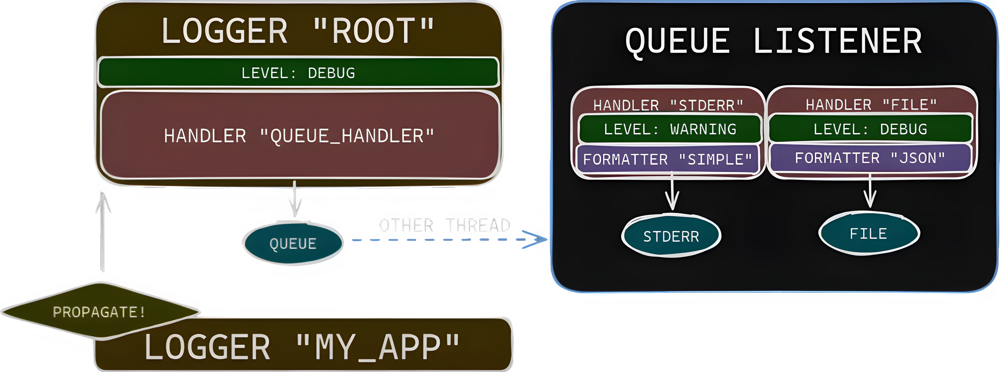

To avoid locking the main thread writing into I/O we need to create a `Queue Handler`. It will implement all the same handlers that root used to have and it will be the only handler on root. Let's adapt the last configuration in order to relief the main thread.

This configuration (`stderr_queue_json_config.json`) demonstrates the use of a logging queue to decouple log emission from log handling, with JSON-structured output to the console:

**Formatters**  
- **json**: Custom JSON formatter that outputs logs as JSON objects.

**Handlers**  
- **stderr**: Processes WARNING and higher level logs, writing them to standard error as JSON.
- **queue_handler**: Routes all log records into a queue, allowing asynchronous and thread-safe handling. Requires a `QueueListener` in the application code to dequeue and forward logs to the `stderr` handler.

**Root Logger**  
- Configured at DEBUG level.
- Uses the `queue_handler` to enqueue all log events.
- A `QueueListener` must be started in code to ensure that enqueued logs are dispatched to the `stderr` handler.

In [22]:
%cat "logging_configs/queued_json_config.json"

{
  "version": 1,
  "disable_existing_loggers": false,
  "formatters": {
    "json": {
      "()": "logging_utils.MyJSONFormatter",
      "fmt_keys": {
        "level": "levelname",
        "message": "message",
        "timestamp": "timestamp",
        "logger": "name",
        "module": "module",
        "function": "funcName",
        "line": "lineno",
        "thread_name": "threadName"
      }
    }
  },
  "handlers": {
    "stderr": {
      "class": "logging.StreamHandler",
      "level": "WARNING",
      "formatter": "json",
      "stream": "ext://sys.stderr"
    },
    "queue_handler": {
      "class": "logging.handlers.QueueHandler",
      "handlers": [
        "stderr"
      ],
      "respect_handler_level": true
    }
  },
  "loggers": {
    "root": {
      "level": "DEBUG",
      "handlers": [
        "queue_handler"
      ]
    }
  }
}


In [23]:
%cat "advanced_examples/queued_json.py"

import atexit
import datetime as dt
import json
import logging
import logging.config
from typing import override

logger = logging.getLogger(__name__)

def setup_logging():
    logging.config.dictConfig(json.load(open("logging_configs/queued_json_config.json")))
    queue_handler = logging.getHandlerByName("queue_handler")
    if queue_handler is not None:
        queue_handler.listener.start()
        atexit.register(queue_handler.listener.stop)

def main():
    setup_logging()
    logger.warning("This is a warning message")
    logger.error("This is an error message")
    logger.critical("This is a critical message")
    logger.info("This is an info message")

if __name__ == "__main__":
    main()

In [24]:
file = "advanced_examples.queued_json"

stdout, stderr = run_module(file)
print("STDOUT:\n>", stdout)
print("STDERR:\n>", stderr)

STDOUT:
> 
STDERR:
> {"level": "WARNING", "message": "This is a warning message", "timestamp": "2025-08-16T22:21:42.069942+00:00", "logger": "__main__", "module": "queued_json", "function": "main", "line": 19, "thread_name": "MainThread"}
{"level": "ERROR", "message": "This is an error message", "timestamp": "2025-08-16T22:21:42.069981+00:00", "logger": "__main__", "module": "queued_json", "function": "main", "line": 20, "thread_name": "MainThread"}
{"level": "CRITICAL", "message": "This is a critical message", "timestamp": "2025-08-16T22:21:42.070003+00:00", "logger": "__main__", "module": "queued_json", "function": "main", "line": 21, "thread_name": "MainThread"}



# 7. Keys

Key assertions to undersand the logging module:

- If a **log record** is **dropped by a handler** it **still passes** on to the rest of the handlers and parent loggers 
- If a **log record** is **dropped by a logger** it get dropped.